# 라이브러리

In [1]:
!pip install torchmetrics
!pip install albumentations
!pip install tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 13.3 MB/s eta 0:00:00


In [2]:
# --- 표준 라이브러리 ---
from itertools import islice
import json
import os
import random
import re
from glob import glob

# --- 서드파티 라이브러리 ---
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw, ImageFont
from tqdm import tqdm
from torchmetrics.detection import MeanAveragePrecision

# --- PyTorch ---
import torch
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split

# --- Torchvision ---
import torchvision
from torchvision import transforms
from torchvision.ops import box_iou, nms
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms.functional import to_pil_image

# --- Albumentations ---
import albumentations as A
from albumentations.pytorch import ToTensorV2

# 디바이스 설정

In [3]:
# 재현성
def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True  # 이미지엔 대체로 이게 빠름

set_seed()

In [4]:
# 디바이스 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device: ", device)

device:  cuda


# 데이터 불러오기

In [6]:
!kaggle competitions download -c ai04-level1-project

 98% 3.82G/3.91G [00:09<00:00, 634MB/s]
100% 3.91G/3.91G [00:09<00:00, 431MB/s]


In [7]:
# data 폴더가 없다면 먼저 생성
!mkdir -p /data

# 다운로드된 zip 파일을 /data 폴더에 압축 해제
!unzip -q /content/ai04-level1-project.zip -d /data

In [8]:
# 데이터 경로 지정
data_dir = '/data'
annotations_dir = os.path.join(data_dir, 'train_annotations')
train_images_dir = os.path.join(data_dir, 'train_images')

# 모든 카테고리 정보를 저장할 딕셔너리
class_names = {0: 'background'}

def find_json_files(root_dir):
    """
    JSON 파일 재귀적으로 찾는 함수
    """
    json_files = []
    for root, dirs, files in os.walk(root_dir):
        for file in files:
            if file.endswith('.json'):
                json_files.append(os.path.join(root, file))
    return json_files

# 모든 JSON 파일 찾기
json_files = find_json_files(annotations_dir)

# 각 JSON 파일에서 카테고리 정보 추출
for json_path in json_files:
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 카테고리 정보 저장
    for category in data.get('categories', []):
        category_id = category['id']
        category_name = category['name']
        class_names[category_id] = category_name

#라벨 매핑
unique_labels = set()
unique_labels = sorted(class_names.keys())

# 배경 클래스를 위해 0을 예약하고, 실제 클래스는 1부터 시작
label_map = {label: idx for idx, label in enumerate(unique_labels)}
inverse_label_map = {idx: label for idx, label in enumerate(unique_labels)}

# 결과 출력
num_classes = len(class_names)

print(f"총 클래스 수 : {num_classes}")
print(f"클래스 목록: {class_names}")

총 클래스 수 : 74
클래스 목록: {0: 'background', 22626: '메가파워정 90mg/병', 3742: '알드린정', 2482: '뮤테란캡슐 100mg', 16547: '가바토파정 100mg', 21025: '펠루비정(펠루비프로펜)', 44198: '케이캡정 50mg', 1899: '보령부스파정 5mg', 3482: '기넥신에프정(은행엽엑스)(수출용)', 25366: '자누메트정 50/850mg', 36636: '로수젯정10/5밀리그램', 27652: '세비카정 10/40mg', 35205: '아토젯정 10/40mg', 27732: '트윈스타정 40/5mg', 34596: '제미메트서방정 50/1000mg', 30307: '트라젠타듀오정 2.5/850mg', 28762: '트라젠타정(리나글립틴)', 20876: '엑스포지정 5/160mg', 16261: '크레스토정 20mg', 3350: '일양하이트린정 2mg', 20013: '마도파정', 29666: '리바로정 4mg', 16231: '리피토정 20mg', 21770: '라비에트정 20mg', 29450: '레일라정', 16550: '동아가바펜틴정 800mg', 31884: '자누메트엑스알서방정 100/1000mg', 18356: '종근당글리아티린연질캡슐(콜린알포세레이트)\xa0', 16687: '오마코연질캡슐(오메가-3-산에틸에스테르90)', 25468: '아모잘탄정 5/100mg', 19860: '노바스크정 5mg', 31704: '낙소졸정 500/20mg', 22073: '리피로우정 20mg', 31862: '아질렉트정(라사길린메실산염)', 6191: '삐콤씨에프정 618.6mg/병', 5885: '타이레놀이알서방정(아세트아미노펜)(수출용)', 25437: '큐시드정 31.5mg/PTP', 23222: '비타비백정 100mg/병', 12080: '리렉스펜정 300mg/PTP', 5093: '삼남건조수산화알루미늄겔정', 27776: '카나브정 60mg', 22361: '맥시부펜이알정 3

In [9]:
# 사용 예
class_names[inverse_label_map[56]] # target['labels'] = 56 이라고 가정

'레일라정'

In [10]:
def check_bbox_validity(json_files):
    """
    JSON 파일들을 검사하여 바운딩 박스가 이미지 크기를 벗어나는 경우를 찾는 함수

    Args:
        json_files: JSON 파일 경로 목록

    Returns:
        invalid_boxes_info: 문제가 있는 바운딩 박스 정보를 담은 리스트
    """
    invalid_boxes_info = []
    total_images = set()
    total_boxes = 0
    invalid_count = 0

    for json_path in json_files:
        try:
            with open(json_path, 'r', encoding='utf-8') as f:
                data = json.load(f)

            # 이미지 정보와 어노테이션 매핑을 위한 딕셔너리 생성
            image_info = {}
            for img in data.get('images', []):
                image_info[img['id']] = {
                    'file_name': img['file_name'],
                    'width': img['width'],
                    'height': img['height']
                }
                total_images.add(img['id'])

            # 어노테이션 확인
            for anno in data.get('annotations', []):
                total_boxes += 1
                image_id = anno['image_id']

                if image_id not in image_info:
                    continue  # 이미지 정보가 없는 경우 건너뜀

                img_width = image_info[image_id]['width']
                img_height = image_info[image_id]['height']

                # 바운딩 박스 정보
                bbox = anno['bbox']  # [x, y, width, height] 형식

                # 바운딩 박스가 이미지 크기를 벗어나는지 확인
                x, y, width, height = bbox
                x_max = x + width
                y_max = y + height

                if x < 0 or y < 0 or x_max > img_width or y_max > img_height:
                    invalid_count += 1
                    invalid_boxes_info.append({
                        'json_file': json_path,
                        'image_id': image_id,
                        'file_name': image_info[image_id]['file_name'],
                        'image_size': [img_width, img_height],
                        'bbox': bbox,
                        'category_id': anno['category_id'],
                        'issues': {
                            'x_out_of_bounds': x < 0 or x_max > img_width,
                            'y_out_of_bounds': y < 0 or y_max > img_height,
                            'x_range': [x, x_max],
                            'y_range': [y, y_max]
                        }
                    })

        except Exception as e:
            print(f"JSON 파일 처리 중 오류: {json_path}, 오류: {e}")
            continue

    print(f"총 {len(json_files)}개 JSON 파일, {len(total_images)}개 이미지, {total_boxes}개 바운딩 박스를 검사했습니다.")
    print(f"총 {invalid_count}개의 유효하지 않은 바운딩 박스를 발견했습니다.")

    # 문제가 있는 바운딩 박스의 일부 예시 출력
    if invalid_boxes_info:
        print("\n===== 유효하지 않은 바운딩 박스 예시 =====")
        for i, item in enumerate(invalid_boxes_info[:5]):  # 처음 5개만 출력
            print(f"파일: {item['file_name']}")
            print(f"이미지 크기: {item['image_size']}")
            print(f"바운딩 박스: {item['bbox']}")
            print(f"문제: {item['issues']}")
            print("-----------------------------------")

        if len(invalid_boxes_info) > 5:
            print(f"... 외 {len(invalid_boxes_info) - 5}개 더 있습니다.")

    return invalid_boxes_info

# 사용 예시:
invalid_boxes = check_bbox_validity(json_files)

총 4526개 JSON 파일, 1489개 이미지, 4526개 바운딩 박스를 검사했습니다.
총 2개의 유효하지 않은 바운딩 박스를 발견했습니다.

===== 유효하지 않은 바운딩 박스 예시 =====
파일: K-003351-016262-018357_0_2_0_2_75_000_200.png
이미지 크기: [976, 1280]
바운딩 박스: [6567, 625, 311, 315]
문제: {'x_out_of_bounds': True, 'y_out_of_bounds': False, 'x_range': [6567, 6878], 'y_range': [625, 940]}
-----------------------------------
파일: K-003544-004543-012247-016551_0_2_0_2_70_000_200.png
이미지 크기: [976, 1280]
바운딩 박스: [653, 8889, 217, 217]
문제: {'x_out_of_bounds': False, 'y_out_of_bounds': True, 'x_range': [653, 870], 'y_range': [8889, 9106]}
-----------------------------------


In [11]:
# 문제 바운딩 박스 빼기
invalid_json_paths = [item['json_file'] for item in invalid_boxes]
json_files = [path for path in json_files if path not in invalid_json_paths]

In [12]:
invalid_boxes = check_bbox_validity(json_files)

총 4524개 JSON 파일, 1489개 이미지, 4524개 바운딩 박스를 검사했습니다.
총 0개의 유효하지 않은 바운딩 박스를 발견했습니다.


# 데이터 시각화

In [13]:
# 한글 오류 제거 코드
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

!apt-get update -qq
!apt-get install fonts-nanum* -qq

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import warnings
warnings.filterwarnings(action='ignore')

path = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf' # 나눔 고딕
font_name = fm.FontProperties(fname=path, size=10).get_name() # 기본 폰트 사이즈 : 10
plt.rc('font', family=font_name)

fm.fontManager.addfont(path)


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 1s (8,939 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 126374 files and dire

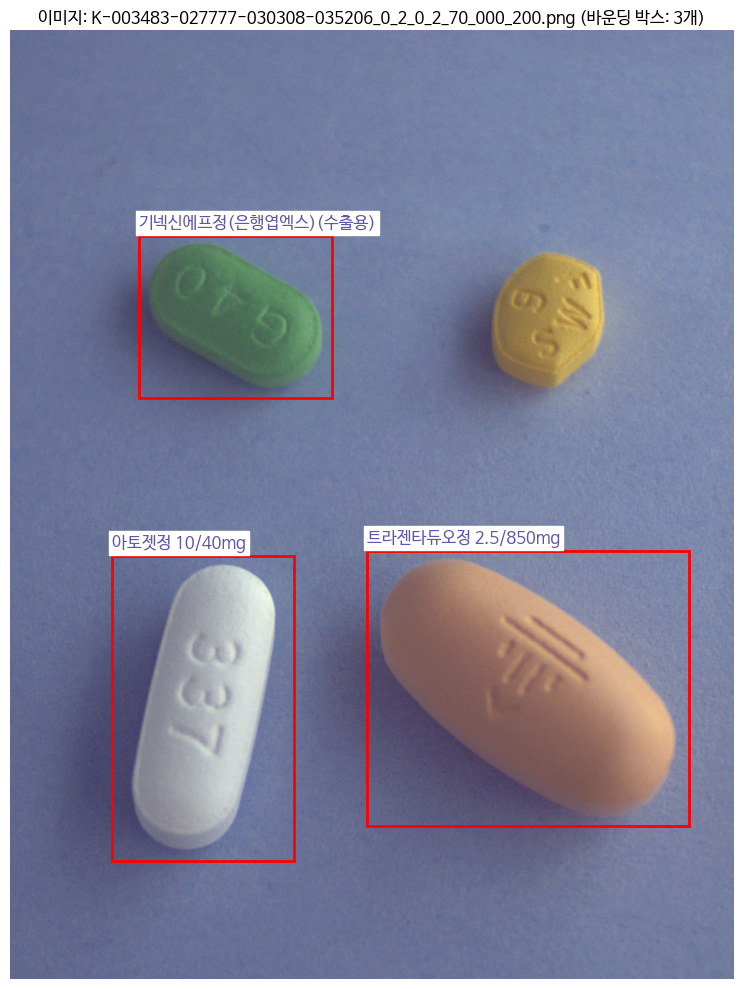

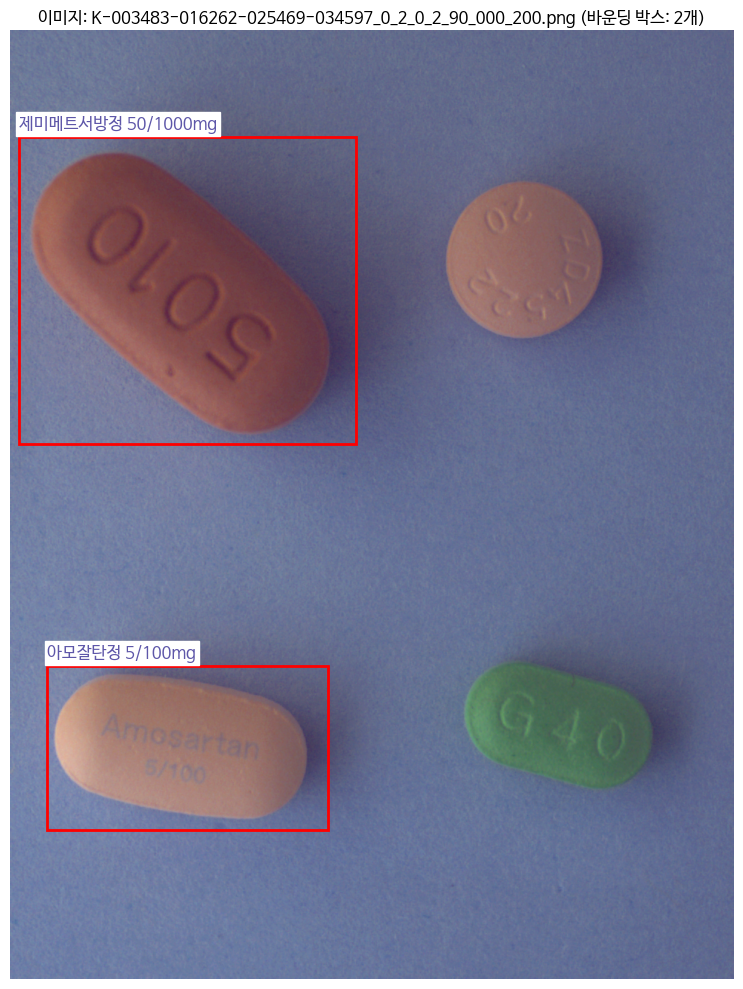

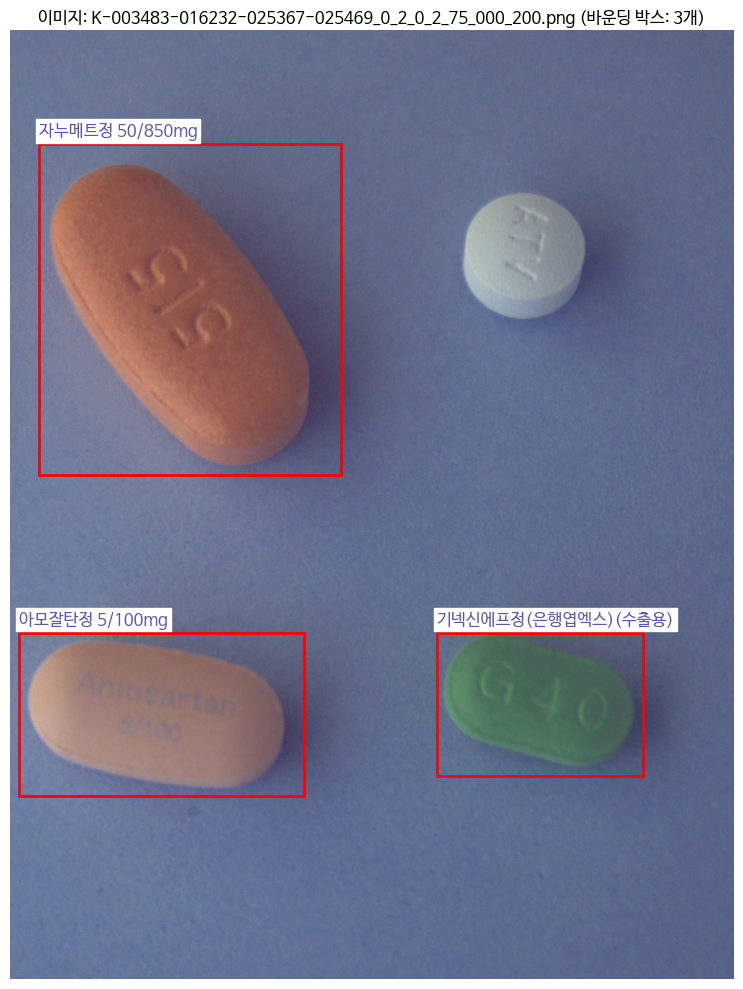

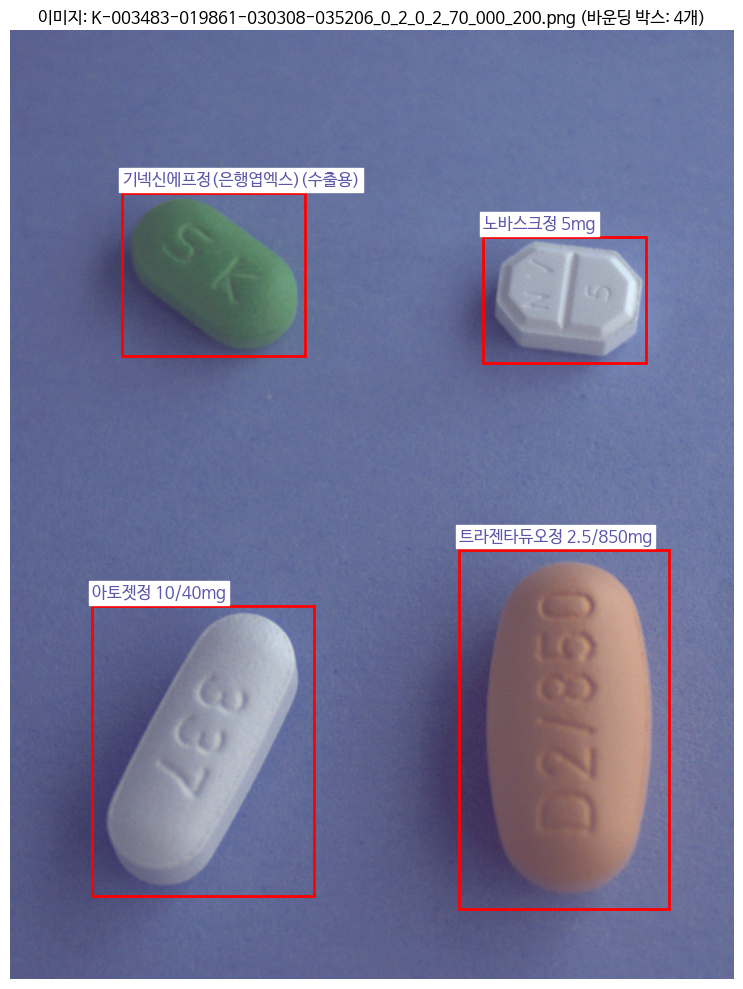

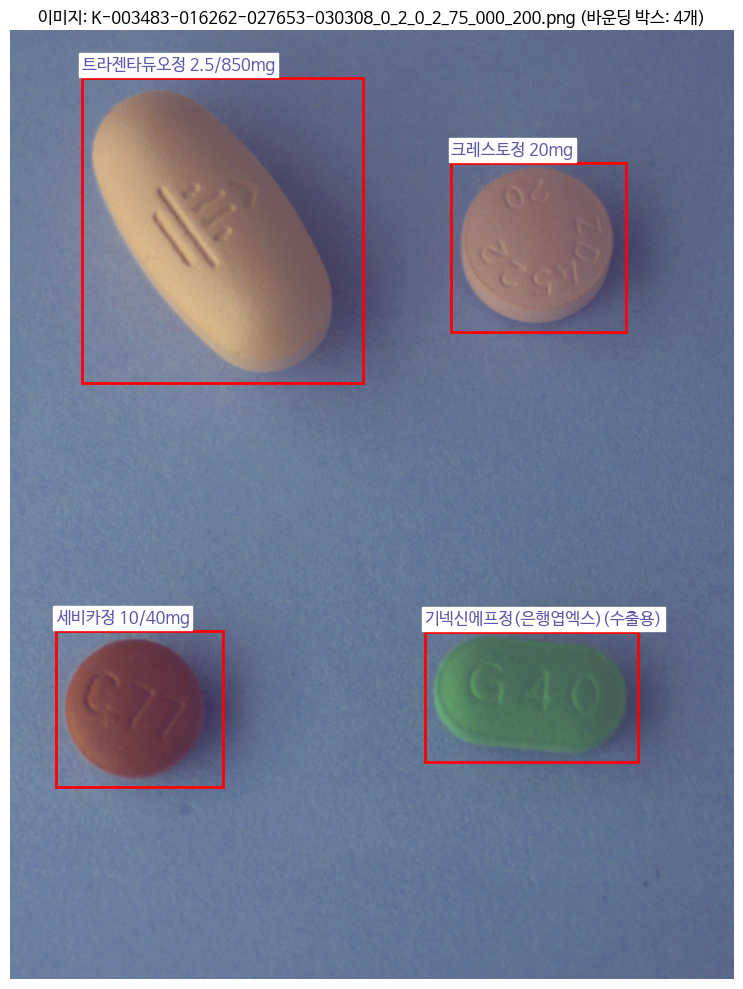

In [14]:
def visualize_pill_dataset(data_dir, json_files, num_samples=5):
    """
    json 파일로 바운딩 박스를 시각화하는 함수

    Args:
        data_dir: 이미지 파일이 있는 디렉토리 경로
        json_files: JSON 파일 경로 리스트
        num_samples: 시각화할 샘플 수 (기본값: 5)
    """
    annotations = {}

    # 각 JSON 파일 처리 -> dict에 [img file_name]을 key로 {어노테이션정보: [바운드박스]}뽑아서 리스트로 저장하기
    for json_path in json_files:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

            file_name = data['images'][0]['file_name']
            bbox = data['annotations'][0]['bbox']
            category_id = data['annotations'][0]['category_id']

            if file_name not in annotations:
                annotations[file_name] = []

            annotations[file_name].append({category_id: bbox})

    items_list = list(annotations.items())
    random.shuffle(items_list)

    # 시각화
    for file_name, anno in items_list[:num_samples]:
        image_path = os.path.join(data_dir, file_name)
        img = Image.open(image_path).convert("RGB")

        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(img)

        # 모든 바운딩 박스 그리기
        for a in anno:

            category_id = list(a.keys())[0]
            bbox = list(a.values())[0]

            x, y, width, height = bbox
            label = class_names.get(category_id, f"ID: {category_id}")

            # 바운딩 박스 그리기
            rect = patches.Rectangle(
                (x, y), width, height,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)

            # 라벨 텍스트
            ax.text(
                x, y - 12, label,
                fontsize=12, color='#5e57a9',
                bbox=dict(facecolor='white', alpha=1, pad=2, edgecolor='White')
            )

        ax.axis('off')
        plt.title(f"이미지: {file_name} (바운딩 박스: {len(anno)}개)")
        plt.tight_layout()
        plt.show()


visualize_pill_dataset(train_images_dir, json_files, num_samples=5)

# 데이터셋 정의

In [15]:
class PillDataset(Dataset):
    def __init__(self, data_dir, json_files, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.images = {}  # 이미지 ID를 키로 사용하는 딕셔너리로 변경
        self.annotations = {}  # 이미지 ID를 키로 사용하는 딕셔너리로 변경
        self.categories = {}
        self.image_ids = []  # 순서 유지를 위한 ID 리스트

        # 각 JSON 파일 처리
        for json_path in json_files:
            try:
                with open(json_path, 'r', encoding='utf-8') as f:
                    data = json.load(f)

                # 카테고리 정보 저장
                for category in data.get('categories', []):
                    self.categories[category['id']] = category['name']

                # 이미지 정보 저장
                for img_info in data.get('images', []):
                    image_id = img_info['id']
                    image_file = img_info['file_name']
                    image_path = os.path.join(data_dir, 'train_images', image_file)

                    # 이미지 ID가 아직 없으면 추가
                    if image_id not in self.images and os.path.exists(image_path):
                        self.images[image_id] = {
                            'id': image_id,
                            'file_path': image_path,
                            'width': img_info['width'],
                            'height': img_info['height'],
                            'file_name': image_file
                        }
                        self.annotations[image_id] = []
                        if image_id not in self.image_ids:
                            self.image_ids.append(image_id)

                # 어노테이션 정보 저장 (모든 JSON 파일의 어노테이션을 누적)
                for anno in data.get('annotations', []):
                    image_id = anno['image_id']
                    if image_id in self.images:  # 해당 이미지가 존재하는 경우에만 어노테이션 추가
                        self.annotations[image_id].append(anno)

            except Exception as e:
                print(f"JSON 파일 처리 중 오류: {json_path}, 오류: {e}")
                continue


        # 유효한 이미지만 필터링 (어노테이션이 있는 이미지만 유지)
        valid_image_ids = []
        for image_id in self.image_ids:
            if len(self.annotations[image_id]) > 0:
                valid_image_ids.append(image_id)
            else:
                if image_id in self.images:
                    del self.images[image_id]
                if image_id in self.annotations:
                    del self.annotations[image_id]

        self.image_ids = valid_image_ids
        print(f"총 {len(self.image_ids)}개의 유효한 이미지가 로드되었습니다.")


    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        # 이미지 ID로 정보 가져오기
        image_id = self.image_ids[idx]
        img_info = self.images[image_id]
        img_path = img_info['file_path']

        # 이미지 로드 (PIL 대신 OpenCV 사용)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # BGR에서 RGB로 변환

        # 어노테이션 처리
        annotations = self.annotations[image_id]
        boxes = []
        labels = []

        for anno in annotations:
            # bbox: [x, y, width, height] 형식
            x, y, width, height = anno['bbox']
            '''
            # 모든 좌표를 정규화된 값(0~1)으로 변환
            x_min = x / img_info['width']
            y_min = y / img_info['height']
            x_max = (x + width) / img_info['width']
            y_max = (y + height) / img_info['height']

            boxes.append([x_min, y_min, x_max, y_max])'''
            # [x_min, y_min, x_max, y_max] 형식으로 변환
            boxes.append([x, y, x+width, y+height])
            labels.append(label_map[anno['category_id']]) #0~73 값 변환

        # 빈 박스 처리 (필요한 경우)
        if len(boxes) == 0:
            boxes = [[0, 0, 1, 1]]  # 더미 박스
            labels = [0]  # 배경 클래스

        # 이미지와 바운딩 박스 함께 변환
        if self.transform is not None:
            transformed = self.transform(
                image=img,
                bboxes=boxes,
                category_ids=labels
            )
            img = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['category_ids']
        else:
            # transform이 없는 경우, 수동으로 텐서 변환
            img = torch.from_numpy(img.transpose(2, 0, 1)).float() / 255.0


        # PyTorch 텐서로 변환
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        # 이미지 ID 및 기타 정보
        image_id_tensor = torch.tensor([image_id])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        # 타겟 딕셔너리 생성
        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': image_id_tensor,
            'area': area,
        }


        return img, target

In [16]:
# 테스트 데이터 셋
class PillTestDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(data_dir) if f.endswith('.png')]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.data_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, img_name  # 이미지와 파일명 반환

# 이미지 전처리

In [17]:
# 훈련 데이터셋을 위한 증강 (랜덤 변환 포함)
transforms_train = A.Compose([
    A.Resize(224, 224),                # 이미지 크기 조절
    A.HorizontalFlip(p=0.5),           # 50% 확률로 좌우 반전
    A.Rotate(limit=15, p=0.5),         # ±15도 회전
    A.RandomBrightnessContrast(p=0.5), # 밝기 및 대비 랜덤 변경
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']))

# 검증 데이터셋을 위한 전처리 (랜덤 변환 없음)
transforms_val = A.Compose([
    A.Resize(224, 224),                # 이미지 크기 조절
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']))

# 테스트 데이터셋을 위한 전처리
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [18]:
# 커스텀 래퍼 클래스 생성
class AugmentationWrapper(Dataset):
    def __init__(self, dataset, transforms):
        self.dataset = dataset
        self.transforms = transforms

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        img, target = self.dataset[idx]

        if torch.is_tensor(img):
            # C,H,W -> H,W,C 순서로 변경하고 NumPy 배열로 변환
            img_np = img.permute(1, 2, 0).cpu().numpy()

            # 값 범위를 0-1에서 0-255로 다시 조정 (필요한 경우)
            if img_np.max() <= 1.0:
                img_np = (img_np * 255).astype(np.uint8)


        # 바운딩 박스와 라벨 추출
        boxes = target['boxes'].numpy().tolist()
        labels = target['labels'].numpy().tolist()

        # Albumentations 변환 적용
        transformed = self.transforms(
            image=img_np,
            bboxes=boxes,
            category_ids=labels
        )

        # 변환된 결과 다시 타겟에 저장
        target['boxes'] = torch.tensor(transformed['bboxes'], dtype=torch.float32)
        target['labels'] = torch.tensor(transformed['category_ids'], dtype=torch.int64)

        return transformed['image'], target

# 데이터셋 생성

In [19]:
# 데이터셋 생성
pill_dataset = PillDataset(data_dir, json_files)

# 데이터 확인
img, target = pill_dataset[0]
print(f"이미지 타입: {type(img)}")
print(f"이미지 크기: {img.shape[1:]}") #CxHxW
print(f"바운딩 박스: {target['boxes']}")
print(f"라벨: {target['labels']}")

총 1489개의 유효한 이미지가 로드되었습니다.
이미지 타입: <class 'torch.Tensor'>
이미지 크기: torch.Size([1280, 976])
바운딩 박스: tensor([[ 530.,  590.,  837., 1072.],
        [ 495.,  169.,  810.,  466.],
        [  88.,  665.,  347., 1141.]])
라벨: tensor([42,  6,  2])


In [20]:
# 학습/검증 세트 분할 (8:2)
train_size = int(0.8 * len(pill_dataset))
val_size = len(pill_dataset) - train_size
train_dataset, val_dataset = random_split(pill_dataset, [train_size, val_size])

# 데이터셋 생성
train_dataset = AugmentationWrapper(train_dataset, transforms_train)
val_dataset = AugmentationWrapper(val_dataset, transforms_val)

# 데이터 확인
img, target = train_dataset[0]
print(f"이미지 타입: {type(img)}")
print(f"이미지 크기: {img.shape[1:]}")
print(f"바운딩 박스: {target['boxes']}")
print(f"라벨: {target['labels']}")

이미지 타입: <class 'torch.Tensor'>
이미지 크기: torch.Size([224, 224])
바운딩 박스: tensor([[150.2804, 141.1776, 199.9025, 177.2627],
        [ 19.9533, 123.3599,  87.5784, 201.9319],
        [ 36.9728,  44.7380,  66.3920,  79.7900]])
라벨: tensor([65, 55,  1])


In [21]:
test_dir = os.path.join(data_dir, 'test_images')
test_dataset = PillTestDataset(test_dir, transforms_test)

image, img_name = test_dataset[0]
print(f"테스트 이미지 파일명: {img_name}")
print(f"이미지 타입: {type(image)}")
print(f"이미지 크기: {image.shape[1:]}")

테스트 이미지 파일명: 641.png
이미지 타입: <class 'torch.Tensor'>
이미지 크기: torch.Size([224, 224])


## ㄴ 시각화

In [22]:
# 전처리된 데이터셋 시각화 함수
def visualize_preprocessed_dataset(dataset, num_samples=5, figsize=(15, 10)):
    """
    전처리된 데이터셋의 샘플 이미지와 바운딩 박스를 시각화합니다.

    Args:
        dataset: 데이터셋 객체 (이미지와 타겟 정보를 반환하는 __getitem__ 메서드 필요)
        num_samples: 시각화할 샘플 수
        figsize: 그림 크기
    """
    fig, axes = plt.subplots(num_samples, 2, figsize=figsize)

    # 랜덤 인덱스 선택
    indices = random.sample(range(len(dataset)), num_samples)

    for i, idx in enumerate(indices):
        # 원본 이미지와 타겟 가져오기 (데이터셋 구조에 따라 수정 필요)
        img, target = dataset[idx]

        # 이미지가 텐서인 경우 numpy 배열로 변환
        if isinstance(img, torch.Tensor):
            # 정규화된 텐서를 이미지로 변환 (0-1 범위로 클리핑)
            img_np = img.numpy().transpose(1, 2, 0)
            img_np = np.clip(img_np, 0, 1)
        else:
            img_np = img

        # 원본 이미지 표시
        axes[i, 0].imshow(img_np)
        axes[i, 0].set_title(f'원본 이미지 #{idx}')
        axes[i, 0].axis('off')

        # 바운딩 박스 표시
        axes[i, 1].imshow(img_np)

        # 타겟에서 바운딩 박스 정보 추출 (데이터셋 구조에 따라 수정 필요)
        if 'boxes' in target:
            boxes = target['boxes']
            labels = target['labels'] if 'labels' in target else None

            for j, box in enumerate(boxes):
                # 박스 좌표 [x_min, y_min, x_max, y_max]
                x_min, y_min, x_max, y_max = box
                width = x_max - x_min
                height = y_max - y_min

                # 바운딩 박스 그리기
                rect = patches.Rectangle(
                    (x_min, y_min), width, height,
                    linewidth=2, edgecolor='r', facecolor='none'
                )
                axes[i, 1].add_patch(rect)

                # 레이블 표시 (있는 경우)
                if labels is not None:
                    label = labels[j]
                    axes[i, 1].text(
                        x_min, y_min - 5, f'Class {label}',
                        color='white', fontsize=10,
                        bbox=dict(facecolor='red', alpha=0.5)
                    )

        axes[i, 1].set_title(f'바운딩 박스 시각화 #{idx}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# 데이터 증강 효과 시각화 함수
def visualize_alb_augmentations(image_path, bboxes, category_ids, transforms_alb, num_samples=5, figsize=(15, 10)):
    """
    하나의 원본 이미지와 바운딩 박스에 Albumentations 변환을 적용하고 시각화합니다.

    Args:
        image_path (str): 원본 이미지 파일 경로.
        bboxes (list): 원본 이미지의 바운딩 박스 리스트 (Pascal VOC format: [xmin, ymin, xmax, ymax]).
        category_ids (list): 각 바운딩 박스에 해당하는 카테고리 ID 리스트.
        transforms_alb (A.Compose): 적용할 Albumentations 변환 파이프라인.
        num_samples (int): 시각화할 증강된 샘플의 수 (원본 포함).
        figsize (tuple): matplotlib figure의 크기.
    """
    # 원본 이미지 로드 (Albumentations는 OpenCV/NumPy 포맷을 선호)
    original_img = cv2.imread(image_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB) # BGR -> RGB 변환

    # 그리드 크기 계산
    n_cols = 3 # 한 줄에 3개의 이미지
    n_rows = (num_samples + n_cols - 1) // n_cols # 필요한 줄 수 계산

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()

    # ------------------ 원본 이미지 시각화 ------------------
    ax = axes[0]
    ax.imshow(original_img)
    ax.set_title('원본 이미지')
    ax.axis('off')

    for bbox in bboxes:
        x_min, y_min, x_max, y_max = bbox
        width = x_max - x_min
        height = y_max - y_min
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    # ------------------ 증강된 이미지 시각화 ------------------
    for i in range(1, num_samples):
        ax = axes[i]

        # Albumentations 변환 적용
        # ToTensorV2를 사용하면 이미지가 Tensor로 변환되므로, imshow를 위해 다시 numpy로 변환해야 합니다.
        # 또한, Normalize가 적용되어 있으므로 정규화를 되돌려야 합니다.
        transformed = transforms_alb(image=original_img, bboxes=bboxes, category_ids=category_ids)
        transformed_img = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_category_ids = transformed['category_ids']

        # Tensor 이미지를 numpy 배열로 변환 및 정규화 역변환
        if isinstance(transformed_img, torch.Tensor):
            # Normalization의 mean과 std를 역변환
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])

            img_np = transformed_img.cpu().numpy().transpose(1, 2, 0) # C H W -> H W C
            img_np = (img_np * std + mean) * 255.0 # 역정규화 (0-1 범위로)
            img_np = np.clip(img_np, 0, 255).astype(np.uint8) # 0-255 범위로 클리핑 및 uint8 변환
        else:
            img_np = transformed_img # 이미 numpy인 경우

        ax.imshow(img_np)
        ax.set_title(f'증강된 이미지 {i}')
        ax.axis('off')

        for j, bbox in enumerate(transformed_bboxes):
            x_min, y_min, x_max, y_max = bbox
            width = x_max - x_min
            height = y_max - y_min

            # 바운딩 박스 그리기
            rect = patches.Rectangle(
                (x_min, y_min), width, height,
                linewidth=2, edgecolor='red', facecolor='none'
            )
            ax.add_patch(rect)

            # 레이블 표시 (있는 경우)
            if transformed_category_ids:
                label = transformed_category_ids[j]
                ax.text(
                    x_min, y_min - 5, f'Class {label}',
                    color='white', fontsize=10,
                    bbox=dict(facecolor='red', alpha=0.5)
                )

    # 사용하지 않는 서브플롯 숨기기
    for i in range(num_samples, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# 클래스 분포 시각화 함수
def visualize_class_distribution(dataset, figsize=(10, 6)):
    """
    데이터셋의 클래스 분포를 시각화합니다.

    Args:
        dataset: 데이터셋 객체
        figsize: 그림 크기
    """
    # 클래스 카운트
    class_counts = {}

    for i in range(len(dataset)):
        _, target = dataset[i]
        if 'labels' in target:
            labels = target['labels']
            for label in labels:
                label_id = label.item() if isinstance(label, torch.Tensor) else label
                if label_id not in class_counts:
                    class_counts[label_id] = 0
                class_counts[label_id] += 1

    # 클래스 분포 그래프
    plt.figure(figsize=figsize)
    plt.bar(class_counts.keys(), class_counts.values())
    plt.xlabel('클래스')
    plt.ylabel('이미지 수')
    plt.title('클래스별 분포')
    plt.xticks(list(class_counts.keys()))
    plt.grid(axis='y', alpha=0.3)

    # 각 막대 위에 숫자 표시
    for i, v in enumerate(class_counts.values()):
        plt.text(i, v + 0.5, str(v), ha='center')

    plt.tight_layout()
    plt.show()

# 바운딩 박스 크기 분포 시각화
def visualize_bbox_size_distribution(dataset, figsize=(15, 6)):
    """
    바운딩 박스 크기 분포를 시각화합니다.

    Args:
        dataset: 데이터셋 객체
        figsize: 그림 크기
    """
    # 바운딩 박스 너비와 높이 수집
    widths = []
    heights = []
    areas = []

    for i in range(len(dataset)):
        _, target = dataset[i]
        if 'boxes' in target:
            boxes = target['boxes']
            for box in boxes:
                x_min, y_min, x_max, y_max = box
                width = x_max - x_min
                height = y_max - y_min

                widths.append(width)
                heights.append(height)
                areas.append(width * height)

    # 히스토그램으로 시각화
    fig, axes = plt.subplots(1, 3, figsize=figsize)

    axes[0].hist(widths, bins=30)
    axes[0].set_title('바운딩 박스 너비 분포')
    axes[0].set_xlabel('너비')
    axes[0].set_ylabel('빈도')

    axes[1].hist(heights, bins=30)
    axes[1].set_title('바운딩 박스 높이 분포')
    axes[1].set_xlabel('높이')

    axes[2].hist(areas, bins=30)
    axes[2].set_title('바운딩 박스 면적 분포')
    axes[2].set_xlabel('면적')

    plt.tight_layout()
    plt.show()

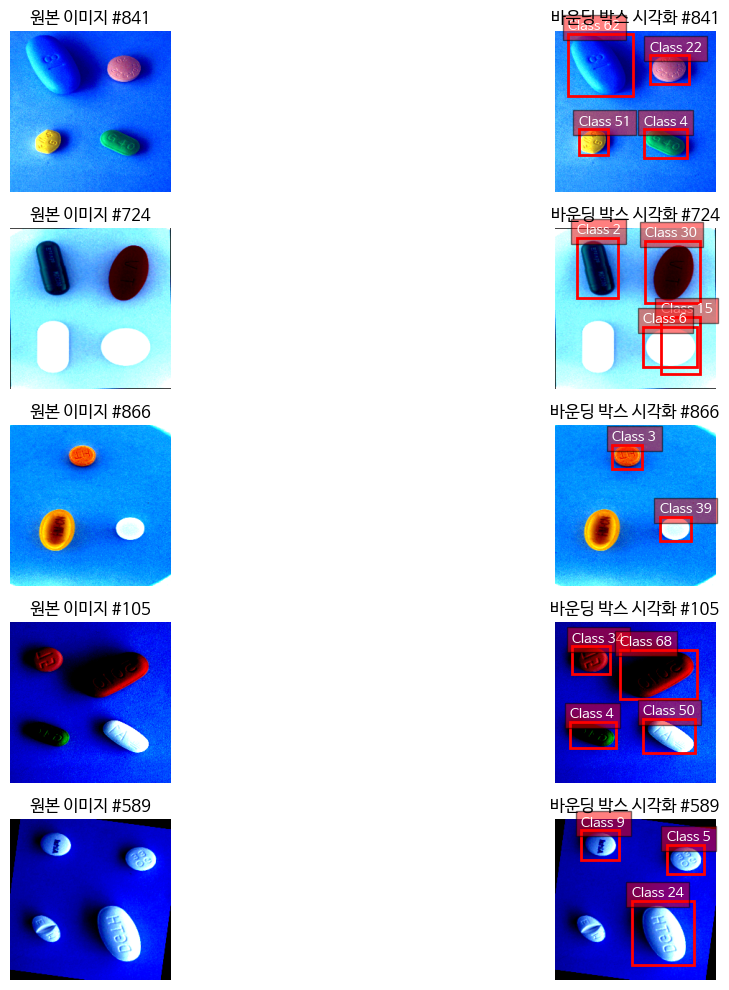

In [23]:
# 1. 데이터셋 시각화
visualize_preprocessed_dataset(train_dataset, num_samples=5)

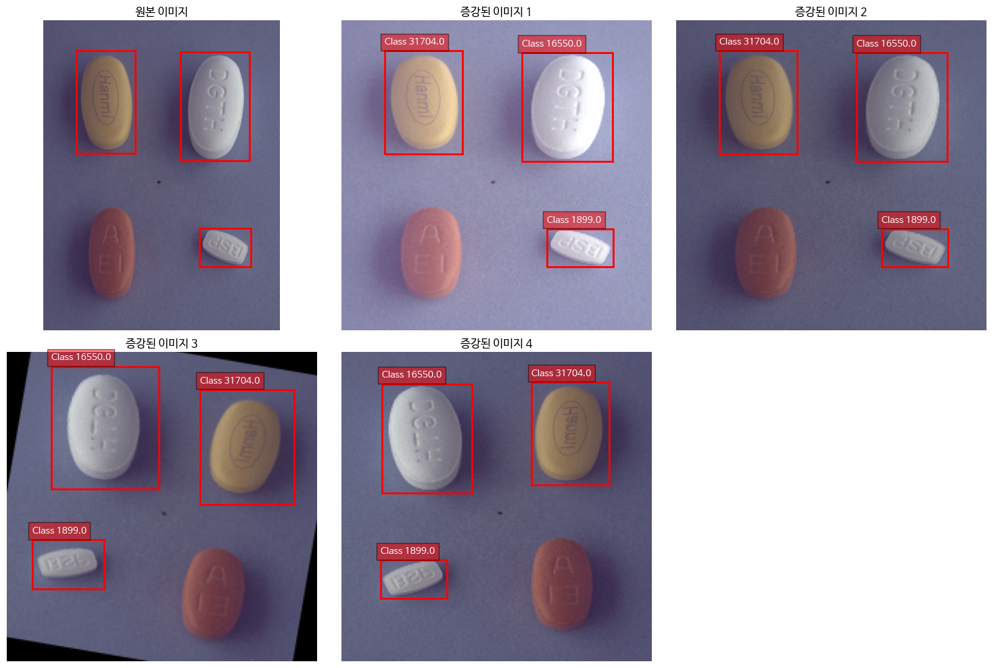

In [24]:
# 2. 데이터 증강 효과 시각화
def convert_bbox_format(bbox):
    # [x_min, y_min, width, height, class_id] -> [x_min, y_min, x_max, y_max]
    x_min, y_min, width, height = bbox[:4]
    x_max = x_min + width
    y_max = y_min + height
    return [x_min, y_min, x_max, y_max]

example_bboxes = [
    [
                645,
                859,
                210,
                158
            ],
    [
                566,
                131,
                285,
                450
            ],
    [
                134,
                123,
                245,
                426
            ],
]
example_bboxes = [convert_bbox_format(bbox) for bbox in example_bboxes]

example_category_ids = [1899,16550,31704]
visualize_alb_augmentations('/data/train_images/K-001900-010224-016551-031705_0_2_0_2_70_000_200.png',
                            bboxes=example_bboxes,
                            category_ids=example_category_ids,
                            transforms_alb=transforms_train)

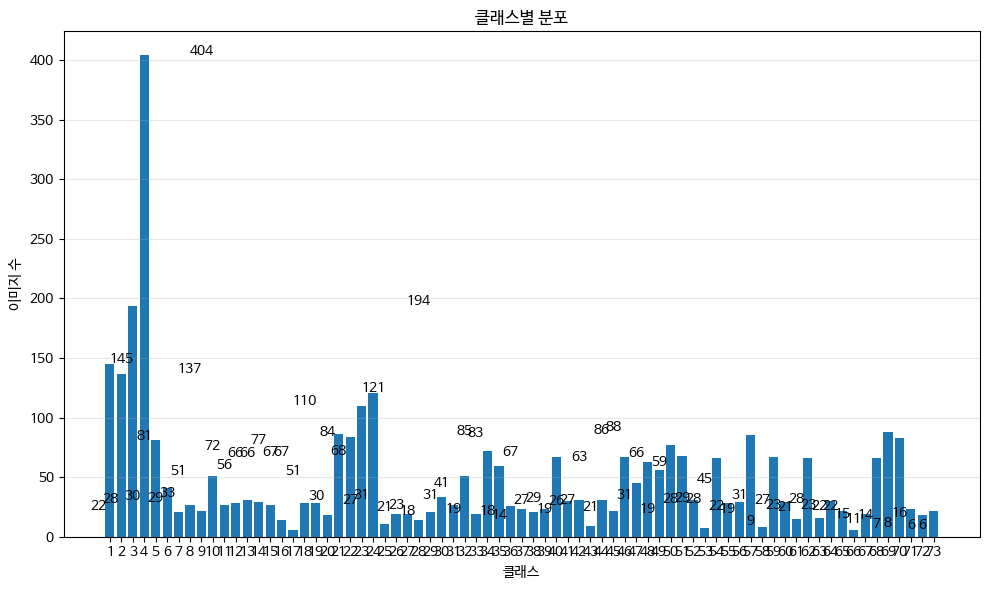

In [25]:
# 3. 클래스 분포 시각화
visualize_class_distribution(train_dataset)

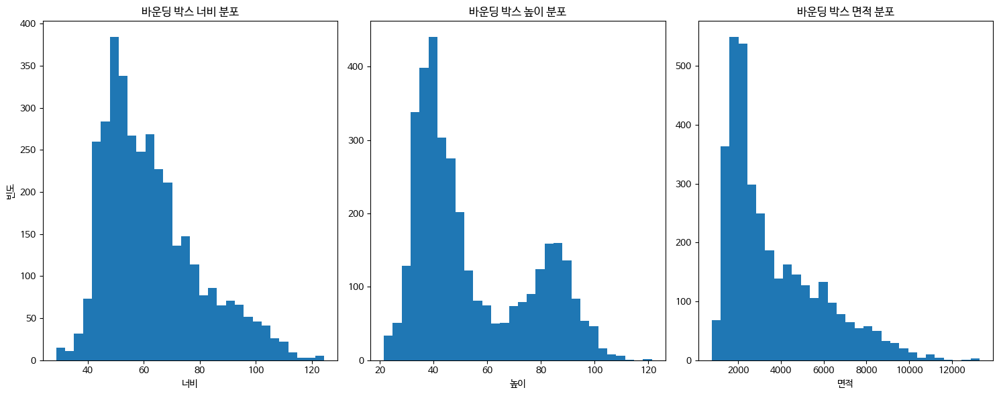

In [26]:
# 4. 바운딩 박스 크기 분포 시각화
visualize_bbox_size_distribution(train_dataset)

# 함수 정의

## 모델 생성 함수

In [27]:
def load_model(num_classes):

    model = fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model.to(device)

## 학습 함수

In [28]:
def train(model, dataloader, optimizer, epoch, device):
    """모델 학습 함수"""
    model.train()
    running_loss = 0.0
    num_batches = 0

    pbar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"학습 Epoch {epoch+1}")

    for i, (data, target) in pbar:
        try:
            # 데이터를 디바이스로 이동
            data = [image.to(device) for image in data]
            target = [{k: v.to(device) if isinstance(v, torch.Tensor) else v
                      for k, v in t.items()} for t in target]

            # 빈 타겟 필터링
            valid_indices = []
            valid_data = []
            valid_target = []

            for idx, t in enumerate(target):
                if len(t['boxes']) > 0 and len(t['labels']) > 0:
                    valid_indices.append(idx)
                    valid_data.append(data[idx])
                    valid_target.append(t)

            if len(valid_data) == 0:
                continue

            optimizer.zero_grad()

            # 모델 forward pass
            loss_dict = model(valid_data, valid_target)

            # 손실 계산
            losses = sum(loss for loss in loss_dict.values())

            # NaN 체크
            if torch.isnan(losses):
                print(f"NaN loss detected at batch {i}")
                continue

            # Backward pass
            losses.backward()

            # 그래디언트 클리핑
            #torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            optimizer.step()

            running_loss += losses.item()
            num_batches += 1

            pbar.set_postfix({
                'loss': losses.item(),#현재 배치 손실
                'avg_loss': running_loss/num_batches if num_batches > 0 else 0 #누적평균손실
            })

        except Exception as e:
            print(f"Error in batch {i}: {e}")
            continue

    return running_loss / max(num_batches, 1)

## 검증 함수

In [29]:
def validation(model, dataloader, epoch, device):
    """
    검증 함수
    (x, y, width, height) 형식의 바운딩 박스 사용
    mAP@[0.75:0.95] 지표를 측정합니다.
    """
    model.eval()

    # mAP@[0.75:0.95]를 위해 iou_thresholds를 0.75부터 0.95까지로 설정
    competition_iou_thresholds = [0.75, 0.80, 0.85, 0.90, 0.95]

    metric = MeanAveragePrecision(
        box_format="xyxy",  # 바운딩 박스 형식: [x1, y1, x2, y2]
        iou_type="bbox",    # IoU 계산 타입
        iou_thresholds=competition_iou_thresholds # 대회에서 요구하는 임계값들만 지정
    ).to(device)


    pbar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"검증 Epoch {epoch+1}")

    with torch.no_grad():
        for i, (data, target) in pbar:
            data = [img.to(device) for img in data]
            targets_device = [{k: v.to(device) if isinstance(v, torch.Tensor) else v
                             for k, v in t.items()} for t in target]

            predictions = model(data)
            metric.update(predictions, targets_device)

    results = metric.compute()

    print(f"===== 검증 결과 (에포크 {epoch+1}) =====")
    print(f"mAP (IoU=0.75:0.95): {results['map']:.4f}")
    print(f"mAP (소형 객체): {results['map_small']:.4f}")
    print(f"mAP (중형 객체): {results['map_medium']:.4f}")
    print(f"mAP (대형 객체): {results['map_large']:.4f}")
    print("=============================\n")

    #pbar.set_postfix(map=results['map'].item())
    #pbar.refresh()

    return {
        'map': results['map'].item(),
    }

## 테스트 함수

In [72]:
# 리사이즈한 이미지에 맞게 박스 좌표를 원래 크기로 변환합니다.
def transform_boxes_to_original_size(boxes, new_size, original_size):
    # NumPy 배열을 PyTorch 텐서로 변환
    if isinstance(boxes, np.ndarray):
        boxes = torch.from_numpy(boxes).to(device)  # device는 적절히 설정

    ratios = [torch.tensor(s_orig, dtype=torch.float32, device=boxes.device) /
              torch.tensor(s, dtype=torch.float32, device=boxes.device)
              for s, s_orig in zip(new_size, original_size)]

    ratio_height, ratio_width = ratios
    xmin, ymin, xmax, ymax = boxes

    xmin = xmin * ratio_width
    xmax = xmax * ratio_width
    ymin = ymin * ratio_height
    ymax = ymax * ratio_height

    boxes = torch.stack((xmin, ymin, xmax, ymax), dim=0)
    boxes_np = boxes.cpu().detach().numpy()

    return boxes_np

In [76]:
def inference(model, dataloader, device, threshold_score=0.1, threshold_nms=0.5, visualize_samples=5):
    """
    모델 추론 및 결과 저장 함수

    Args:
        model: 학습된 모델
        dataloader: 테스트 데이터 로더
        device: 연산 장치 (CPU/GPU)
        threshold_score: 객체 감지 점수 임계값
        threshold_nms: NMS 임계값
        visualize_samples: 시각화할 샘플 수

    Returns:
        pandas.DataFrame: 제출용 데이터프레임
    """
    model.eval()
    submission_records = []
    annotation_id_counter = 1

    with torch.no_grad():
        for batch_idx, (images, img_names) in enumerate(dataloader):
            images = [image.to(device) for image in images]
            predictions = model(images)

            for i, (pred, img_name) in enumerate(zip(predictions, img_names)):
                # 이미지 ID 추출
                image_id = int(img_name.split('.')[0])

                # 시각화 (지정된 샘플 수만큼만)
                should_visualize = batch_idx * len(images) + i < visualize_samples
                if should_visualize:
                    fig, ax = plt.subplots(1, figsize=(10, 10))
                    image_path = os.path.join(test_dir, img_name)
                    img = Image.open(image_path).convert("RGB")
                    ax.imshow(img)

                # 예측 결과가 있는 경우에만 처리
                if len(pred['boxes']) > 0:
                    # NMS 및 점수 필터링 적용
                    keep = nms(pred['boxes'], pred['scores'], threshold_nms)
                    score_mask = pred['scores'][keep] > threshold_score
                    keep = keep[score_mask]

                    # 결과 추출
                    boxes = pred['boxes'][keep].cpu().numpy()
                    labels = pred['labels'][keep].cpu().numpy()
                    scores = pred['scores'][keep].cpu().numpy()

                    # 바운딩 박스 크기 조정을 위한 이미지 크기 변수처리
                    new_size = images[i].shape[-2:]
                    img_array = np.array(img)
                    original_size = img_array.shape[:2]

                    # 각 감지된 객체에 대한 처리
                    for j in range(len(boxes)):
                        #box = boxes[j]
                        box = transform_boxes_to_original_size(boxes[j], new_size, original_size)
                        label_id = labels[j]
                        label_name = inverse_label_map[label_id]
                        score = scores[j]

                        # 바운딩 박스 좌표 변환 [x1, y1, x2, y2] → [x, y, w, h]
                        bbox_x, bbox_y = int(box[0]), int(box[1])
                        bbox_w, bbox_h = int(box[2] - box[0]), int(box[3] - box[1])

                        # 제출 데이터 추가
                        submission_records.append({
                            'annotation_id': annotation_id_counter,
                            'image_id': image_id,
                            'category_id': int(label_name),
                            'bbox_x': bbox_x,
                            'bbox_y': bbox_y,
                            'bbox_w': bbox_w,
                            'bbox_h': bbox_h,
                            'score': float(score)
                        })
                        annotation_id_counter += 1

                        # 시각화
                        if should_visualize:
                            # 바운딩 박스와 라벨 표시
                            label_text = f"{class_names[label_name]}: {score:.2f}"
                            rect = patches.Rectangle(
                                (bbox_x, bbox_y), bbox_w, bbox_h,
                                linewidth=2, edgecolor='r', facecolor='none'
                            )
                            ax.add_patch(rect)
                            ax.text(
                                bbox_x, bbox_y - 12, label_text,
                                fontsize=12, color='#5e57a9',
                                bbox=dict(facecolor='white', alpha=1, pad=2, edgecolor='white')
                            )

                # 시각화 완료
                if should_visualize:
                    ax.axis('off')
                    plt.tight_layout()
                    plt.show()

    # # 결과 저장
    submission_df = pd.DataFrame(
        submission_records,
        columns=['annotation_id', 'image_id', 'category_id',
                'bbox_x', 'bbox_y', 'bbox_w', 'bbox_h', 'score']
    )

    # CSV 파일로 저장
    output_csv_path = '/submissions/fasterRCNN_submission.csv'
    os.makedirs(os.path.dirname(output_csv_path), exist_ok=True)
    submission_df.to_csv(output_csv_path, index=False)
    print(f"\nSubmission file saved to {output_csv_path}")

    return submission_df

# 하이퍼 파라미터 정의

In [33]:
# 하이퍼 파라미터 정의
EPOCH = 100
BATCH_SIZE = 16
NUM_WORKERS = 2
LR = 0.0001
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005
LR_STEP = 6
LR_GAMMA = 0.7

# 데이터 로더 생성
def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, collate_fn=collate_fn)
val_loader = DataLoader(dataset=val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, collate_fn=collate_fn)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, collate_fn=collate_fn)

# 모델 생성
model = load_model(num_classes)
model.to(device)

# 옵티마이저, 스케줄러
optimizer = optim.SGD(model.parameters(), lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=LR_STEP, gamma=LR_GAMMA)

# 모델 학습

In [34]:
# 학습 루프
best_map = -float('inf')  # 최소값으로 시작

import gc
gc.collect()  # 가비지 컬렉션 실행

torch.cuda.empty_cache()

for epoch in range(EPOCH):
    train_loss = train(model, train_loader, optimizer, epoch, device)
    result = validation(model, val_loader, epoch, device)
    val_map = result['map']

    scheduler.step()

    # 최적 모델 저장
    if val_map > best_map:    # 성능이 좋아질 때 저장
        best_map = val_map
        torch.save(model.state_dict(), "best_fasterRCNN.pth")
        print(f"Best model saved! mAP: {best_map:.4f}\n")

print("\n\n학습 완료!")

검증 Epoch 1: 100%|██████████| 19/19 [00:30<00:00,  1.63s/it]


===== 검증 결과 (에포크 1) =====
mAP (IoU=0.75:0.95): 0.0000
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0000

Best model saved! mAP: 0.0000



검증 Epoch 2: 100%|██████████| 19/19 [00:25<00:00,  1.33s/it]


===== 검증 결과 (에포크 2) =====
mAP (IoU=0.75:0.95): 0.0000
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0000



검증 Epoch 3: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 3) =====
mAP (IoU=0.75:0.95): 0.0000
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0000



검증 Epoch 4: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 4) =====
mAP (IoU=0.75:0.95): 0.0000
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0001

Best model saved! mAP: 0.0000



검증 Epoch 5: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 5) =====
mAP (IoU=0.75:0.95): 0.0000
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0003

Best model saved! mAP: 0.0000



검증 Epoch 6: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 6) =====
mAP (IoU=0.75:0.95): 0.0001
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0011

Best model saved! mAP: 0.0001



검증 Epoch 7: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 7) =====
mAP (IoU=0.75:0.95): 0.0002
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0020

Best model saved! mAP: 0.0002



검증 Epoch 8: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 8) =====
mAP (IoU=0.75:0.95): 0.0001
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0015



검증 Epoch 9: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 9) =====
mAP (IoU=0.75:0.95): 0.0004
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0030

Best model saved! mAP: 0.0004



검증 Epoch 10: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 10) =====
mAP (IoU=0.75:0.95): 0.0011
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0064

Best model saved! mAP: 0.0011



검증 Epoch 11: 100%|██████████| 19/19 [00:25<00:00,  1.33s/it]


===== 검증 결과 (에포크 11) =====
mAP (IoU=0.75:0.95): 0.0025
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0100

Best model saved! mAP: 0.0025



검증 Epoch 12: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 12) =====
mAP (IoU=0.75:0.95): 0.0040
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0122

Best model saved! mAP: 0.0040



검증 Epoch 13: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 13) =====
mAP (IoU=0.75:0.95): 0.0058
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0152

Best model saved! mAP: 0.0058



검증 Epoch 14: 100%|██████████| 19/19 [00:25<00:00,  1.35s/it]


===== 검증 결과 (에포크 14) =====
mAP (IoU=0.75:0.95): 0.0079
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0188

Best model saved! mAP: 0.0079



검증 Epoch 15: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 15) =====
mAP (IoU=0.75:0.95): 0.0104
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0249

Best model saved! mAP: 0.0104



검증 Epoch 16: 100%|██████████| 19/19 [00:25<00:00,  1.35s/it]


===== 검증 결과 (에포크 16) =====
mAP (IoU=0.75:0.95): 0.0111
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0287

Best model saved! mAP: 0.0111



검증 Epoch 17: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 17) =====
mAP (IoU=0.75:0.95): 0.0136
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0341

Best model saved! mAP: 0.0136



검증 Epoch 18: 100%|██████████| 19/19 [00:25<00:00,  1.35s/it]


===== 검증 결과 (에포크 18) =====
mAP (IoU=0.75:0.95): 0.0143
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0362

Best model saved! mAP: 0.0143



검증 Epoch 19: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 19) =====
mAP (IoU=0.75:0.95): 0.0149
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0387

Best model saved! mAP: 0.0149



검증 Epoch 20: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 20) =====
mAP (IoU=0.75:0.95): 0.0153
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0413

Best model saved! mAP: 0.0153



검증 Epoch 21: 100%|██████████| 19/19 [00:25<00:00,  1.33s/it]


===== 검증 결과 (에포크 21) =====
mAP (IoU=0.75:0.95): 0.0176
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0479

Best model saved! mAP: 0.0176



검증 Epoch 22: 100%|██████████| 19/19 [00:25<00:00,  1.35s/it]


===== 검증 결과 (에포크 22) =====
mAP (IoU=0.75:0.95): 0.0181
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0523

Best model saved! mAP: 0.0181



검증 Epoch 23: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 23) =====
mAP (IoU=0.75:0.95): 0.0203
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0569

Best model saved! mAP: 0.0203



검증 Epoch 24: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 24) =====
mAP (IoU=0.75:0.95): 0.0248
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0645

Best model saved! mAP: 0.0248



검증 Epoch 25: 100%|██████████| 19/19 [00:25<00:00,  1.33s/it]


===== 검증 결과 (에포크 25) =====
mAP (IoU=0.75:0.95): 0.0254
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0654

Best model saved! mAP: 0.0254



검증 Epoch 26: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 26) =====
mAP (IoU=0.75:0.95): 0.0288
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0694

Best model saved! mAP: 0.0288



검증 Epoch 27: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 27) =====
mAP (IoU=0.75:0.95): 0.0293
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0693

Best model saved! mAP: 0.0293



검증 Epoch 28: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 28) =====
mAP (IoU=0.75:0.95): 0.0316
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0760

Best model saved! mAP: 0.0316



검증 Epoch 29: 100%|██████████| 19/19 [00:25<00:00,  1.33s/it]


===== 검증 결과 (에포크 29) =====
mAP (IoU=0.75:0.95): 0.0337
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0768

Best model saved! mAP: 0.0337



검증 Epoch 30: 100%|██████████| 19/19 [00:25<00:00,  1.32s/it]


===== 검증 결과 (에포크 30) =====
mAP (IoU=0.75:0.95): 0.0322
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0763



검증 Epoch 31: 100%|██████████| 19/19 [00:25<00:00,  1.33s/it]


===== 검증 결과 (에포크 31) =====
mAP (IoU=0.75:0.95): 0.0333
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0785



검증 Epoch 32: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 32) =====
mAP (IoU=0.75:0.95): 0.0355
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0839

Best model saved! mAP: 0.0355



검증 Epoch 33: 100%|██████████| 19/19 [00:25<00:00,  1.35s/it]


===== 검증 결과 (에포크 33) =====
mAP (IoU=0.75:0.95): 0.0381
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0884

Best model saved! mAP: 0.0381



검증 Epoch 34: 100%|██████████| 19/19 [00:25<00:00,  1.33s/it]


===== 검증 결과 (에포크 34) =====
mAP (IoU=0.75:0.95): 0.0370
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0887



검증 Epoch 35: 100%|██████████| 19/19 [00:25<00:00,  1.34s/it]


===== 검증 결과 (에포크 35) =====
mAP (IoU=0.75:0.95): 0.0367
mAP (소형 객체): -1.0000
mAP (중형 객체): -1.0000
mAP (대형 객체): 0.0884



학습 Epoch 36:  77%|███████▋  | 58/75 [03:09<00:55,  3.27s/it, loss=0.848, avg_loss=0.787]


KeyboardInterrupt: 

# 결과

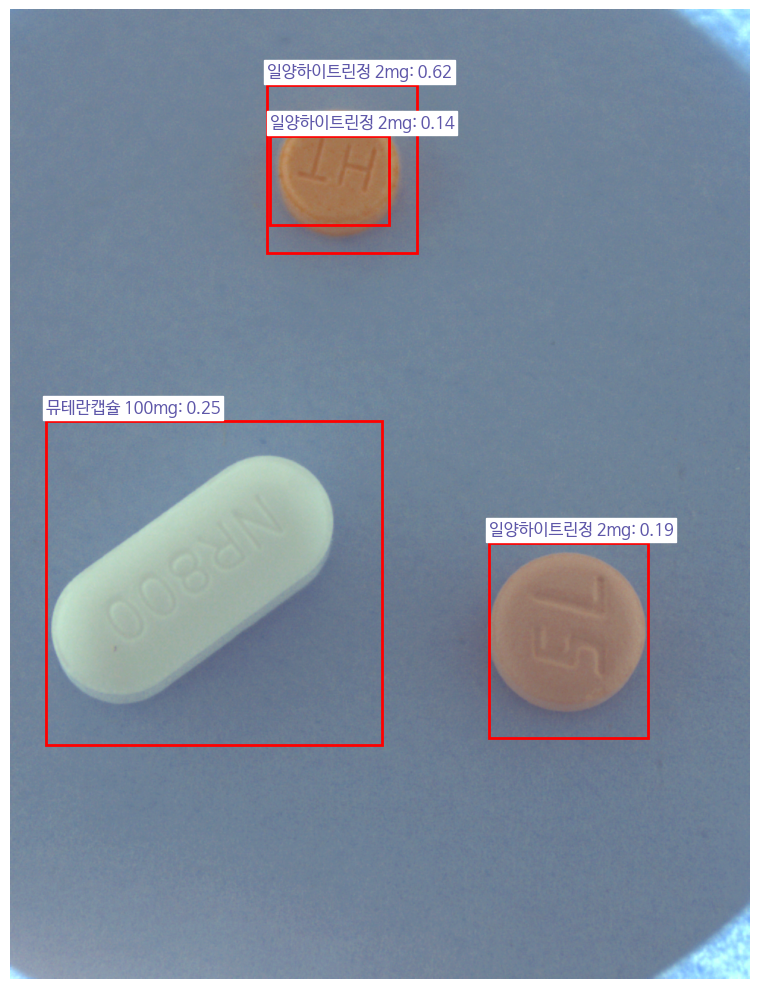

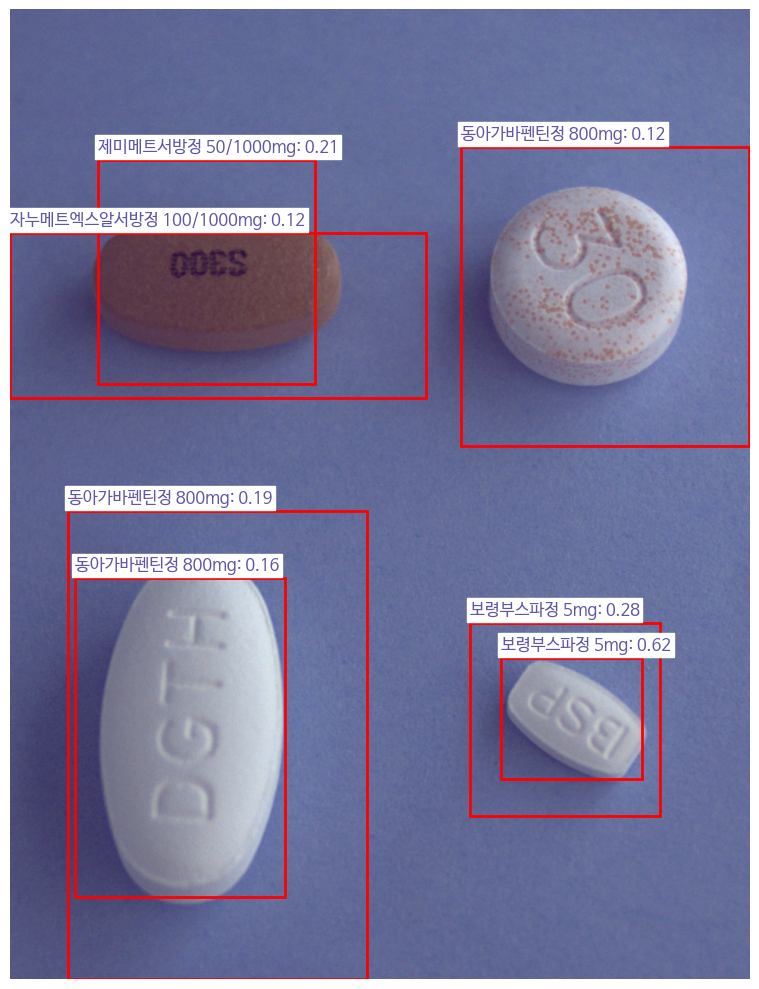

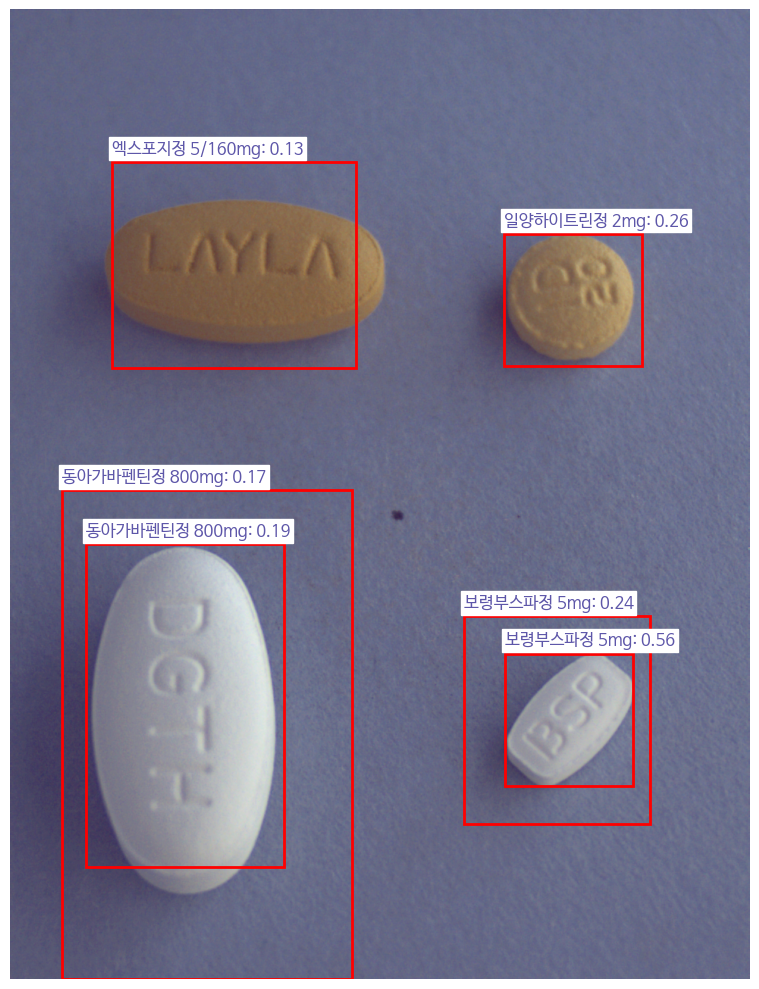

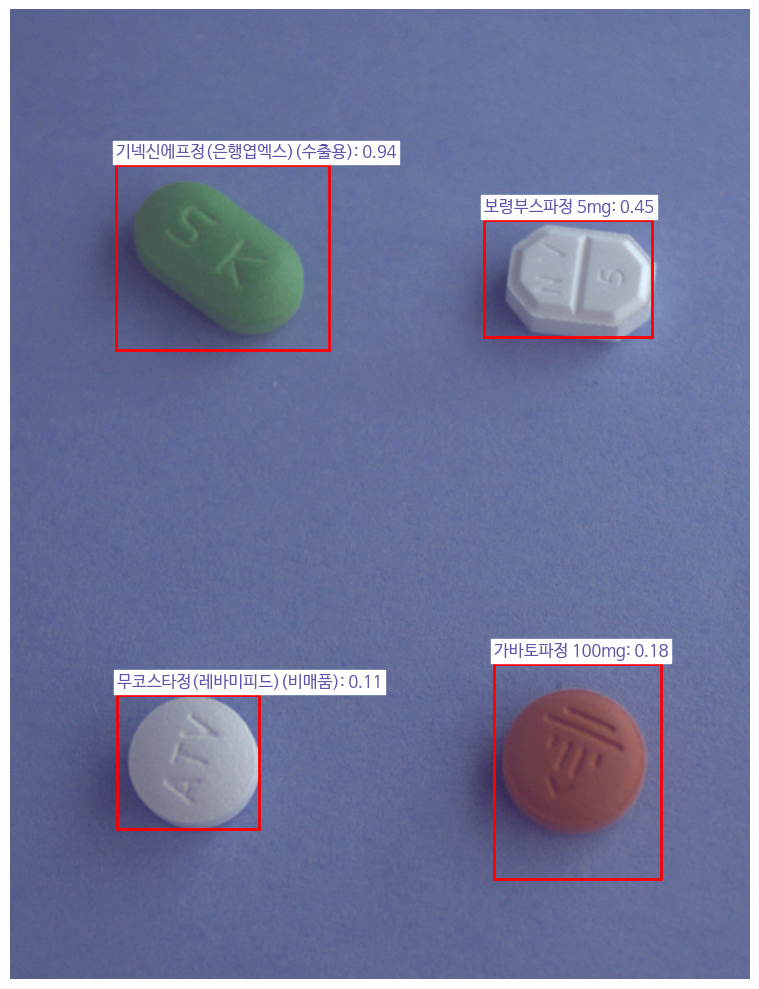

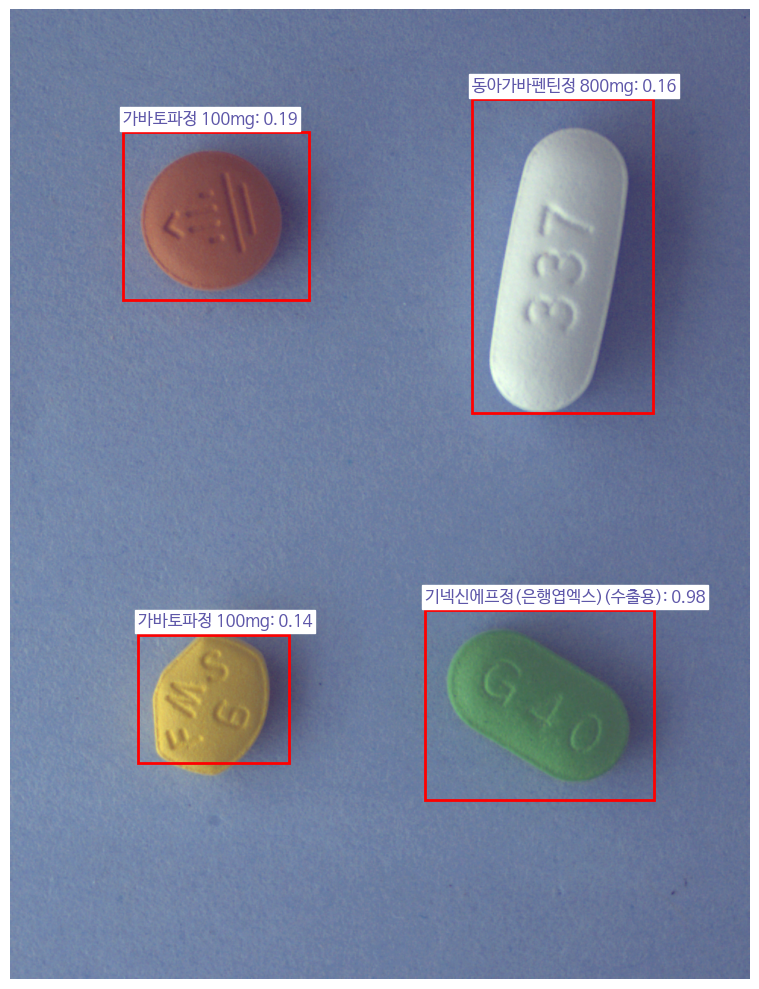


Submission file saved to /submissions/fasterRCNN_submission.csv


In [77]:
submission_df = inference(model, test_loader, device)

In [78]:
submission_df

,annotation_id,image_id,category_id,bbox_x,bbox_y,bbox_w,bbox_h,score
0,1,641,3350,339,100,197,222,0.621553
1,2,641,2482,47,543,444,428,0.248579
2,3,641,3350,631,704,210,258,0.185133
3,4,641,3350,342,167,157,118,0.141731
4,5,1136,1899,647,856,187,160,0.616996
...,...,...,...,...,...,...,...,...
4280,4281,374,16547,77,777,375,274,0.116235
4281,4282,636,16547,629,282,292,215,0.211235
4282,4283,636,16547,190,251,175,215,0.197224
4283,4284,636,1899,579,852,228,213,0.168417
